# Superpixels and Image Segmentation using SLIC

Name: **Omkar Chittar**

----------------------------

In this assignment, you will learn about superpixels. You will first generate superpixels by clustering pixels via k-means. This will generate a superpixel map such as the following:

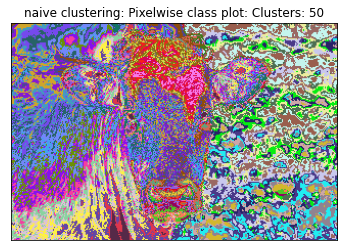

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/CMSC828I/
# %cd /Users/omkar/Desktop/cmsc828i/

Mounted at /content/drive
/content/drive/MyDrive/CMSC828I


You will then implement a better superpixel algorithm: SLIC, which lets you generate superpixel maps like the following:

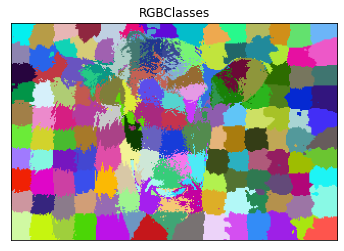

You will then build a segmentation network by training a deep neural network on your superpixels. This part is fairly open-ended, feel free to try any model you can think of (GNN, CNN, Transformer, etc.).

To give an example, for a CNN-based system that reformulates segmentation as superpixel image classification, there are basically three steps in the training stage:

1. Dilate and save each superpixel region from SLIC output into image of size 224X224, alongwith the ground truth segments label.
2. Build a couple of convolution layers to extract the deep features from each Superpixel patch image. Let the last layer be Fully connected layers.
3. Define the segmentation loss as multi-class classification loss and train a convolutional neural network based classifier.

Then, during inference, you would combine the classifier's predicted labels to form the whole input image's Superpixel segmentation results.

## Part 1: Superpixels

For this first part of the assignment, you will implement 2 superpixels methods: k-means pixel clustering, and SLIC.

### Data

First, we download the MSRC labeled imaged database.

In [ ]:
# !wget http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
# !unzip --qq msrc_objcategimagedatabase_v1.zip

--2023-10-07 02:05:21--  http://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.62.216.167, 2600:1407:1800:390::317f, 2600:1407:1800:39b::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.62.216.167|:80... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip [following]
--2023-10-07 02:05:21--  https://download.microsoft.com/download/A/1/1/A116CD80-5B79-407E-B5CE-3D5C6ED8B0D5/msrc_objcategimagedatabase_v1.zip
Connecting to download.microsoft.com (download.microsoft.com)|23.62.216.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 44119839 (42M) [application/octet-stream]
Saving to: ‘msrc_objcategimagedatabase_v1.zip.3’

msrc_objcategimaged 100%[===================>]  42.08

For the first part of this assignment, we will only use the following images. We define the list below as `im_list`.

In [ ]:
im_list = ['MSRC_ObjCategImageDatabase_v1/1_22_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/1_27_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_3_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/3_6_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/6_5_s.bmp',
           'MSRC_ObjCategImageDatabase_v1/7_19_s.bmp']

We provide the following functions as helpers for plotting your results. Please pay attention to their signatures and outputs.





In [ ]:
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

In [ ]:
#All important functions to plot
%matplotlib inline
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches

def plot_image(im, title, xticks = [], yticks = [], isCv2 = True):
    """
    im :Image to plot
    title : Title of image
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    if isCv2:
        im = im[:,:,::-1]
    plt.imshow(im)
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

def superpixel_plot(im,seg,title = "Superpixels"):
    """
    Given an image (nXmX3) and pixelwise class mat (nXm),
    1. Consider each class as a superpixel
    2. Calculate mean superpixel value for each class
    3. Replace the RGB value of each pixel in a class with the mean value

    Inputs:
    im: Input image
    seg: Segmentation map
    title: Title of the plot

    Output: None
    Creates a plot
    """
    clust = np.unique(seg)
    mapper_dict = {i: im[seg == i].mean(axis = 0)/255. for i in clust}

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i]

    plot_image(seg_img,title)

    return

def rgb_segment(seg,n = None,plot = True,title=None,legend = True,color = None):
    """
    Given a segmentation map, get the plot of the classes
    """
    clust = np.unique(seg)
    if n is None:
        n = len(clust)
    if color is None:
        cm = plt.cm.get_cmap('hsv',n+1)
        # mapper_dict = {i:np.array(cm(i/n)) for i in clust}
        mapper_dict = {i:np.random.rand(3,) for i in clust}
    #elif color == 'mean':
        #TODO..get the mean color of cluster center and assign that to mapper_dict

    seg_img =  np.zeros((seg.shape[0],seg.shape[1],3))
    for i in clust:
        seg_img[seg == i] = mapper_dict[i][:3]

    if plot:
        plot_image(seg_img,title = title)
    if legend:
        # get the colors of the values, according to the
        # colormap used by imshow
        patches = [ mpatches.Patch(color=mapper_dict[i], label=" : {l}".format(l=i) ) for i in range(n) ]
        # put those patched as legend-handles into the legend
        plt.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0. )
        plt.grid(True)
        plt.show()

    return seg_img

For example, the following code uses `plot_image` to plot the 6 images we are using for this assignment.

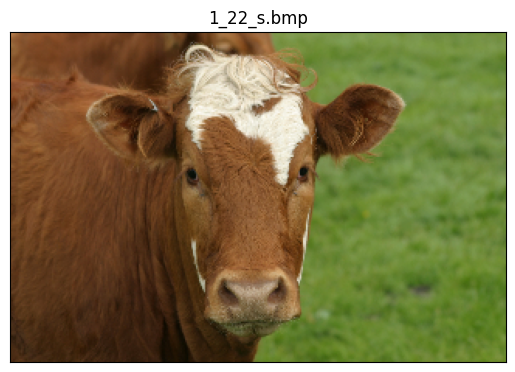

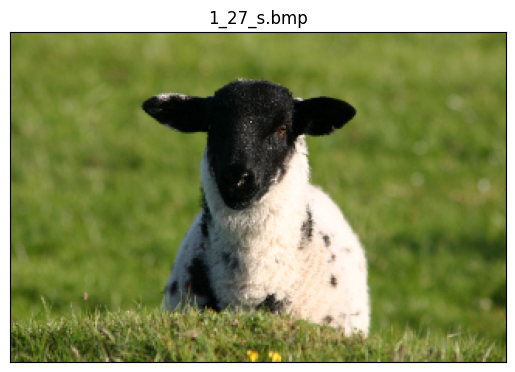

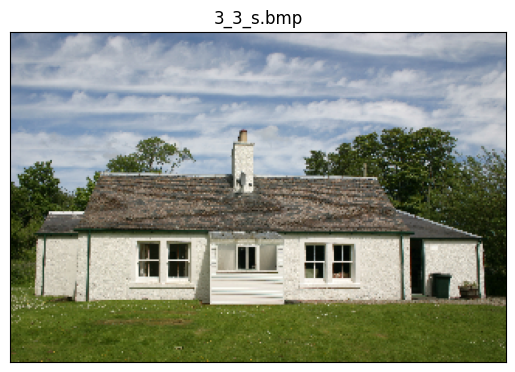

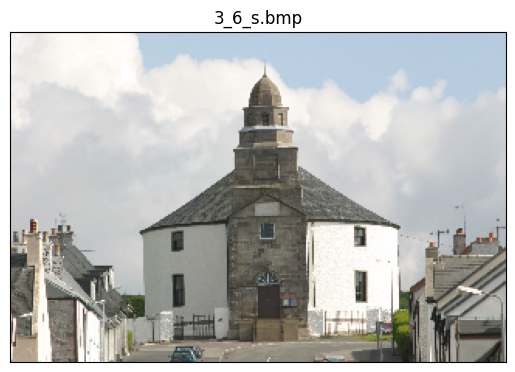

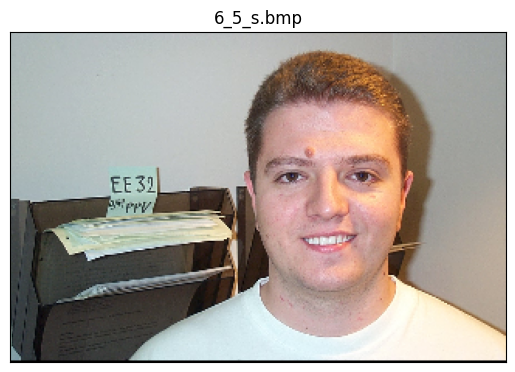

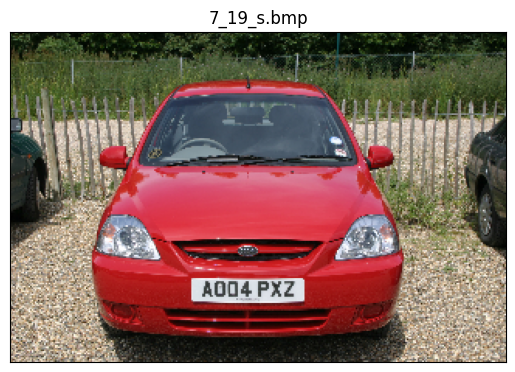

In [ ]:
for i in im_list:
    plot_image(cv2.imread(i),i.split("/")[-1])

### Question 1: Perform k-means on image pixels `(r, g, b, x, y)`. (40 points)

The k-means clustering algorithm is an unsupervised algorithm which, for some items and for some specified number of clusters represented by cluster centers, minimizes the distance between items and their associated cluster centers. It does so by iteratively assigning items to a cluster and recomputing the cluster center based on the assigned items.

Complete the pixel clustering function. It should take input an image (shape = `(n, m, 3)`) and number of clusters. Each pixel should be represented by a vector with 3 values: `(r, g, b, x, y)`.

Then, let our provided code plot the pixelwise and superpixel plots for the cow image (`1_22_s.bmp`), using your `cluster_pixels` implementation with the provided values for the number of clusters: `5, 10, 25, 50, 150`.




<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

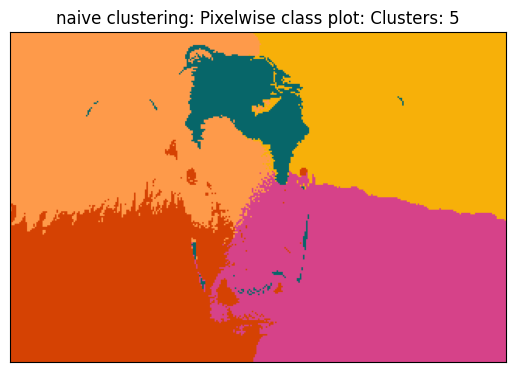

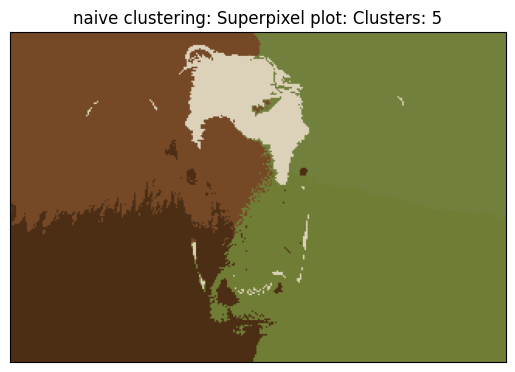

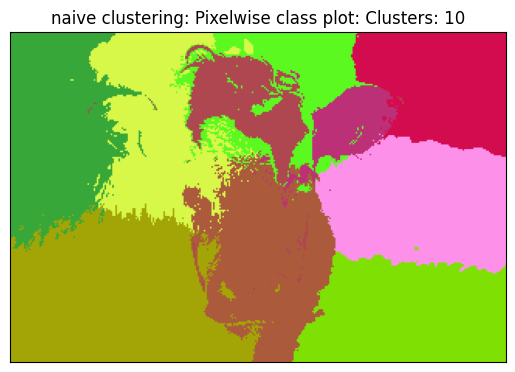

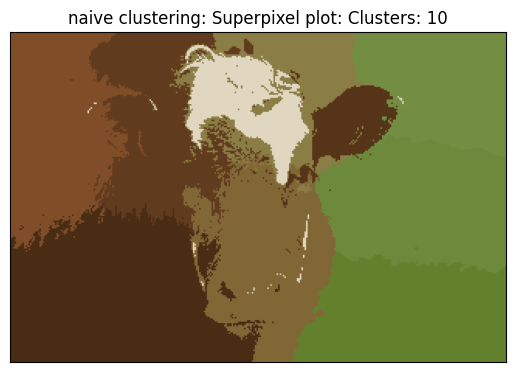

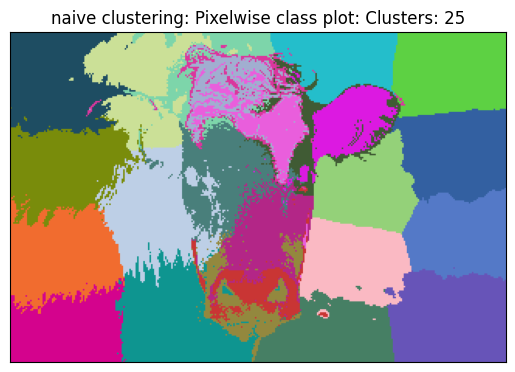

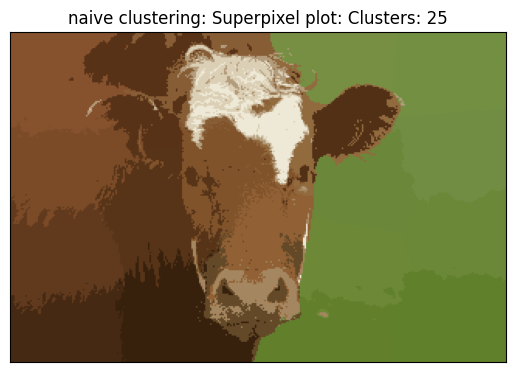

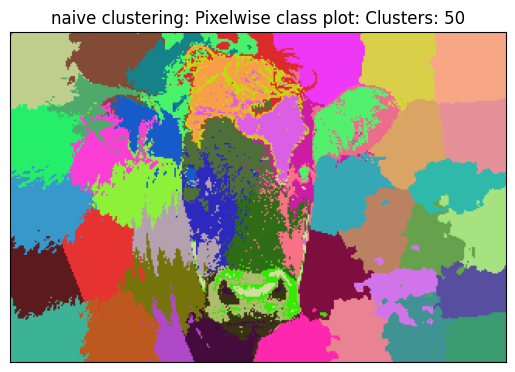

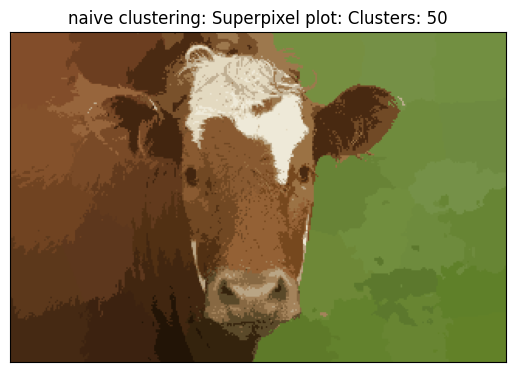

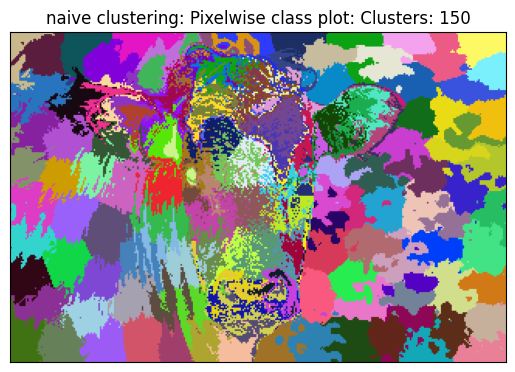

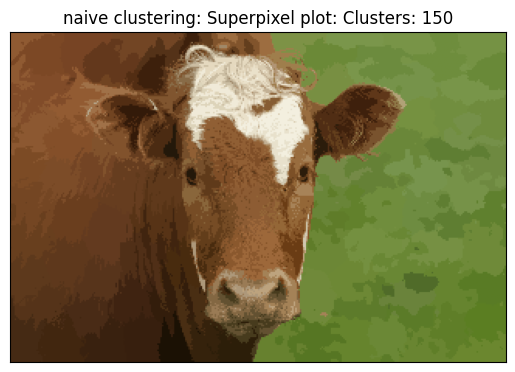

In [ ]:
from sklearn.cluster import KMeans
import numpy as  np

def cluster_rgbxy(im,k):
    """
    Given image im and asked for k clusters, return nXm size 2D array
    segmap[0,0] is the class of pixel im[0,0,:]
    """
    # assert 1==2," NOT IMPLEMENTED"
    #segmap is nXm. Each value in the 2D array is the cluster assigned to that pixel

    height, width, _ = im.shape
    pixel_array = []

    for i in range(height):
      for j in range(width):
          pixel = im[i, j]
          r, g, b = pixel[2], pixel[1], pixel[0]
          pixel_vector = [r, g, b, j, i]
          pixel_array.append(pixel_vector)

    pixel_array = np.array(pixel_array)

    segmap = KMeans(n_clusters = k, n_init='auto').fit(pixel_array)
    segmap = np.array(segmap.labels_)
    segmap = segmap.reshape((height, width))
    return segmap

im = cv2.imread(im_list[0])
for k in [5, 10, 25, 50, 150]:
    clusters = cluster_rgbxy(im,k)
    _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
    superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))

Pick your favorite superpixel **k** value and plot results for all 6 images in `im_list`.

<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)
<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed tw

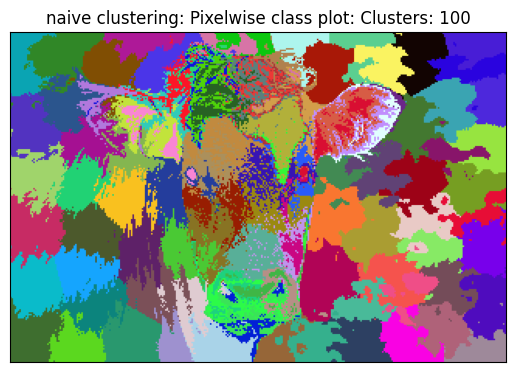

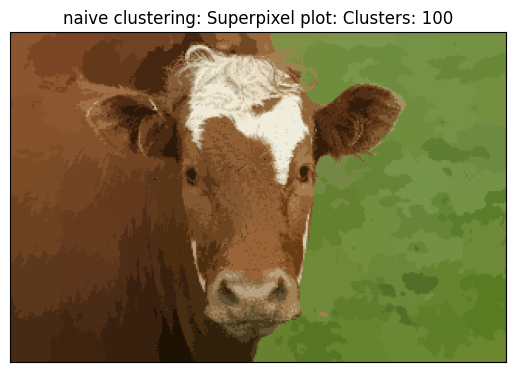

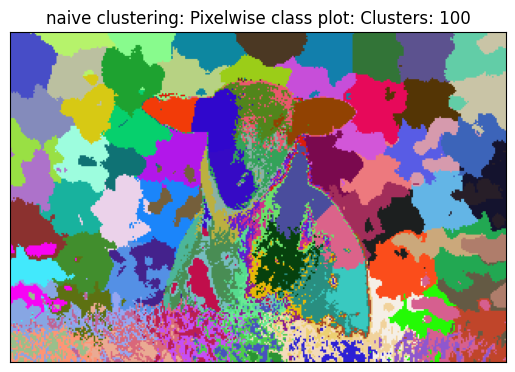

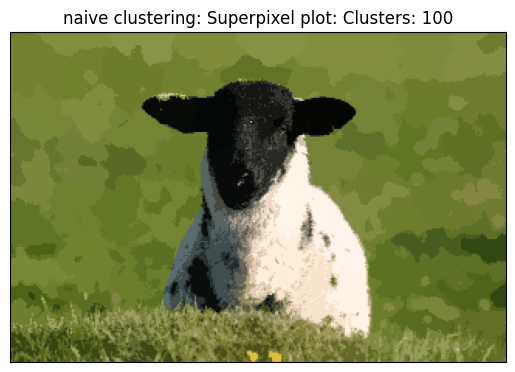

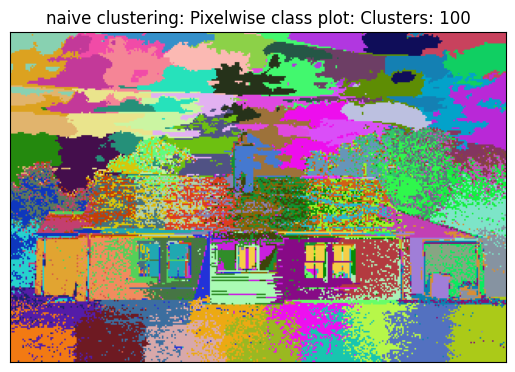

...

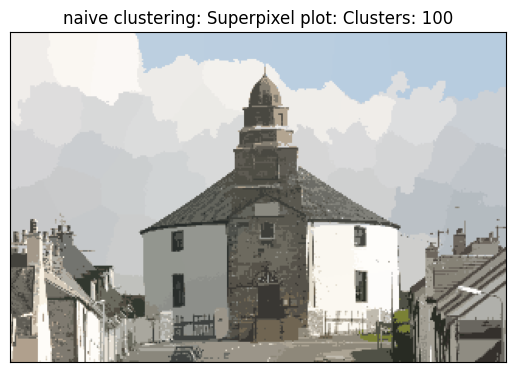

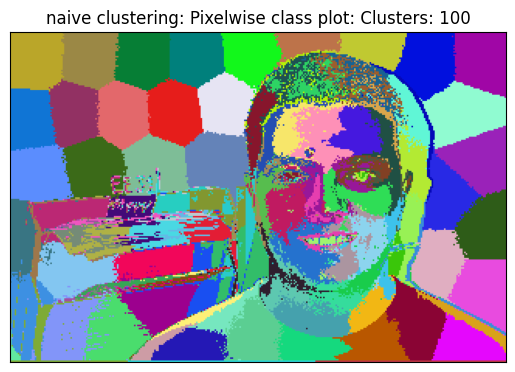

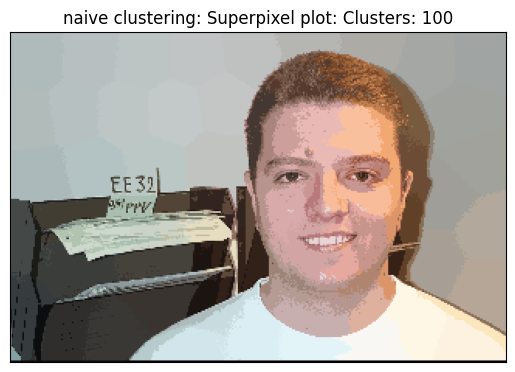

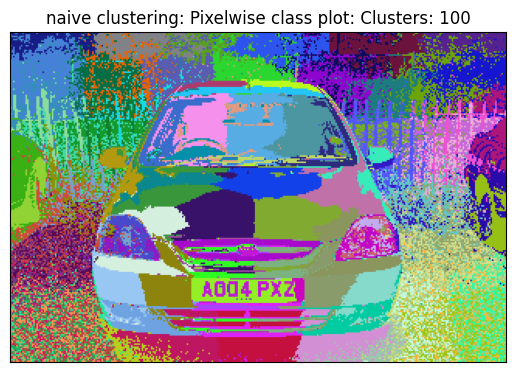

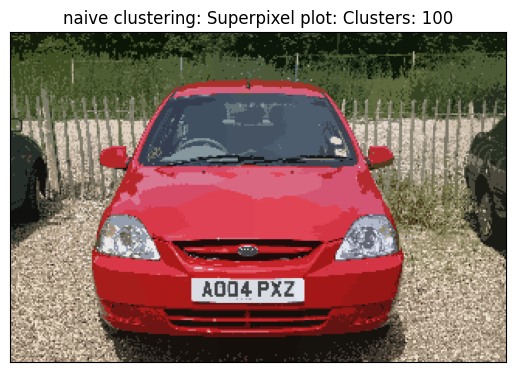

In [ ]:
# TODO: plot for 6 images with chosen k value
k=100
for i in im_list:
  im = cv2.imread(i)
  clusters = cluster_rgbxy(im,k)
  _ = rgb_segment(clusters,n = k, title =  "naive clustering: Pixelwise class plot: Clusters: " + str(k),legend = False)
  superpixel_plot(im,clusters,title =  "naive clustering: Superpixel plot: Clusters: "+ str(k))


### Question 2: Replicate SLIC and Show Results for 6 Images (50 points)

It doesn't look like we have a very favourable outcome with superpixels being implemented with simple clustering. Can we do better? Have a look at the SLIC paper [here](https://www.iro.umontreal.ca/~mignotte/IFT6150/Articles/SLIC_Superpixels.pdf). Incorporate S and m and redefine your distance metric as per the paper.

**Finding an existing implementation of SLIC and using it for your assigment would be considered cheating.**

In [ ]:
import math
import scipy.ndimage

In [ ]:
class Cluster:
    def __init__(self, lab_centroid, xy_centroid):
        self.lab_centroid = lab_centroid
        self.xy_centroid = xy_centroid

class Pixel:
    def __init__(self, lab, xy):
        self.lab = lab
        self.xy = xy

In [ ]:
def perturb(im, height, width, cluster, min_gradient):
    y, x = cluster.xy_centroid
    lab_val = cluster.lab_centroid
    # min_gradient = math.inf

    for i in range(y-1, y+1):
        for j in range(x-1, x+1):
            im = cv2.copyMakeBorder(im, 1, 1, 1, 1, cv2.BORDER_DEFAULT)
            gradient = (np.linalg.norm(im[i+1, j] - im[i-1, j])**2 + np.linalg.norm(im[i, j+1] - im[i, j-1])**2)
            if gradient < min_gradient:
                min_gradient = gradient
                cluster.xy_centroid = np.array([i, j])
                cluster.lab_centroid = im[i, j]
    return cluster

def validate(height, width, y, x):
    if y < 0:
        y = 0
    elif y >= height:
        y = height - 1
    if x < 0:
        x = 0
    elif x >= width:
        x = width - 1
    return y, x

In [ ]:
def SLIC(im, k):
    m=10
    n = 10

    im = cv2.cvtColor(im, cv2.COLOR_BGR2LAB).astype(np.float64)
    height, width, _ = im.shape

    seg_map = -1 * np.ones((height, width))
    dist_map =  math.inf * np.ones((height, width))

    pixel_xy = []
    for i in range(height):
        xy_list = []
        for j in range(width):
            xy_list.append([i,j])
        pixel_xy.append(xy_list)
    pixel_xy = np.array(pixel_xy)

    N = height * width
    size = N/k
    S = int(math.sqrt(size))

    min_gradient = math.inf
    clusters = []
    for i in range(S//2, height, S):
        for j in range(S//2, width, S):
            pixel_lab = im[i,j]
            cluster = Cluster(pixel_lab, np.array([i,j]))
            cluster = perturb(im, height, width, cluster, min_gradient)
            clusters.append(cluster)

    i = 0
    while i < n:
        for cluster_idx, cluster in enumerate(clusters):
            y, x = cluster.xy_centroid
            y, x = int(y), int(x)

            for i in range(y-S, y+S):
                for j in range(x-S, x+S):
                    i, j = validate(height, width, i, j)
                    pixel_lab = im[i,j]
                    current_pix = Pixel(pixel_lab, np.array([i,j]))
                    centroid_pix = Pixel(cluster.lab_centroid, cluster.xy_centroid)

                    d_lab = np.linalg.norm(current_pix.lab - centroid_pix.lab)
                    d_xy = np.linalg.norm(current_pix.xy - centroid_pix.xy)
                    dist = (d_lab) + ((m/S) * (d_xy))

                    if dist < dist_map[i,j]:
                        dist_map[i,j] = dist
                        seg_map[i,j] = cluster_idx + 1

        for cluster_idx, cluster in enumerate(clusters):
            match_idx = (seg_map == (cluster_idx+1))

            lab_pixel = im[match_idx]
            xy_pixel = pixel_xy[match_idx]

            lab_avg = lab_pixel.mean(axis=0)
            xy_avg = xy_pixel.mean(axis=0)

            cluster.lab_centroid = lab_avg
            cluster.xy_centroid = xy_avg

        i += 1
    return seg_map

With SLIC implemented, plot results for all 6 images.

generating clusters for image 1


<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


generating clusters for image 2
generating clusters for image 3
generating clusters for image 4
generating clusters for image 5
generating clusters for image 6


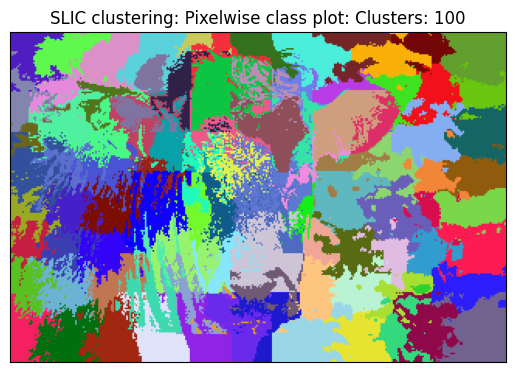

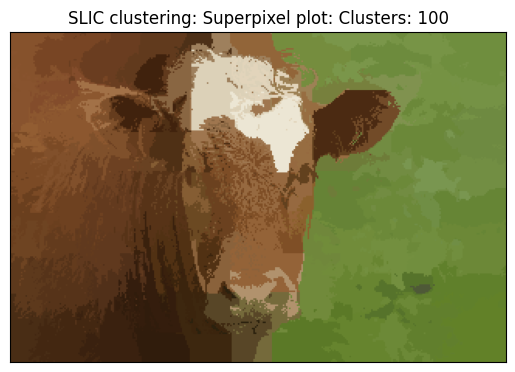

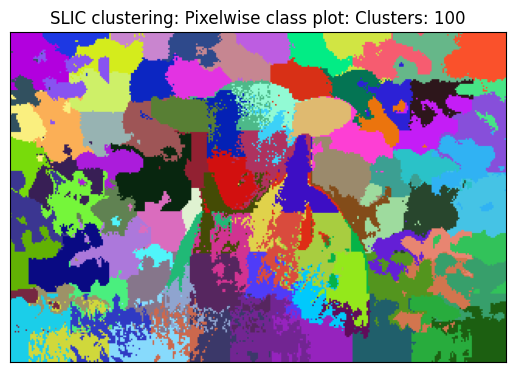

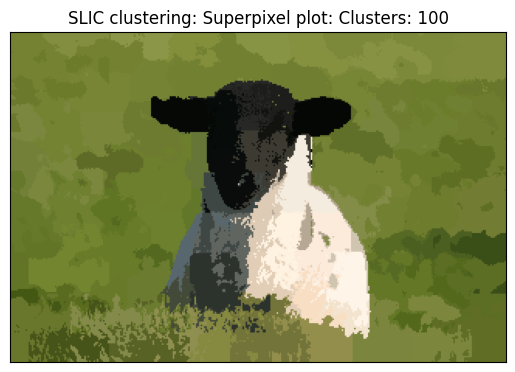

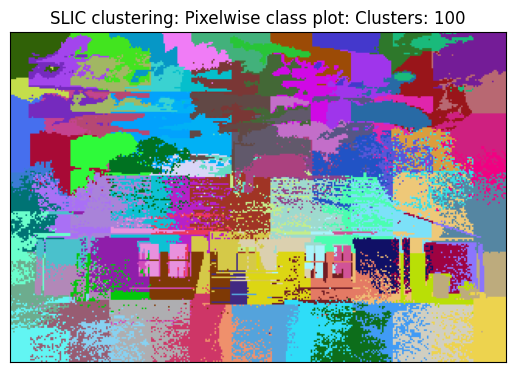

...

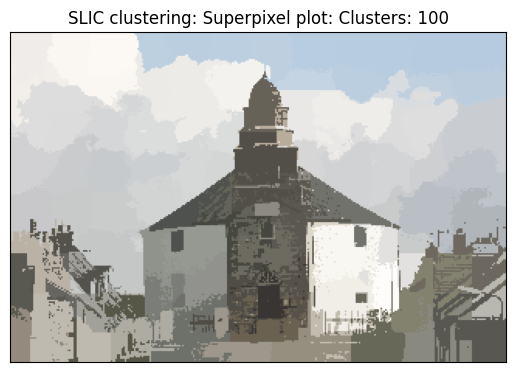

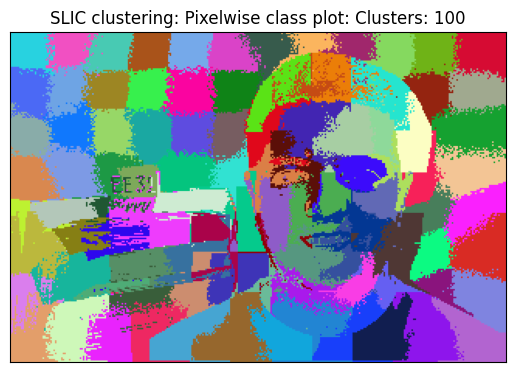

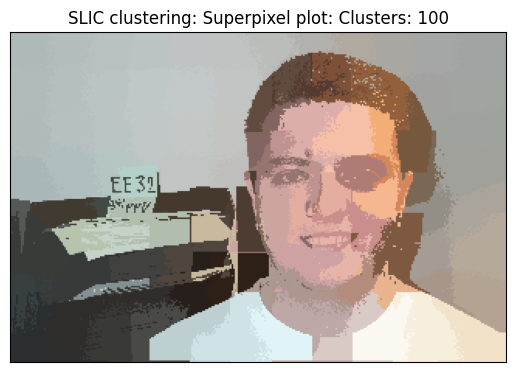

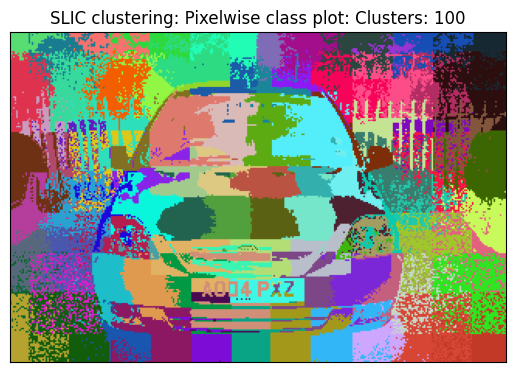

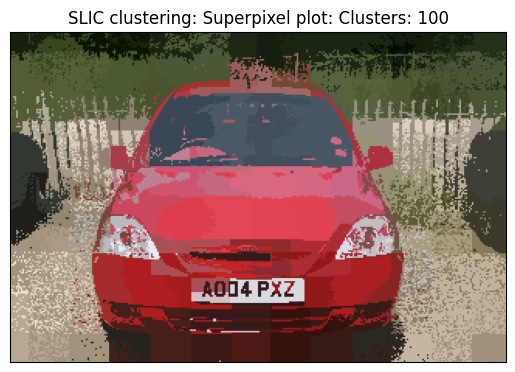

In [ ]:
k = 100
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  print('generating clusters for image', i+1)
  clusters = SLIC(im, k)
  _ = rgb_segment(clusters,n = k, title =  "SLIC clustering: Pixelwise class plot: Clusters: " + str(k), legend = False)
  superpixel_plot(im,clusters,title =  "SLIC clustering: Superpixel plot: Clusters: "+ str(k))

### Question 3: What advantage did the SLIC give compared to `(r, g, b, x, y)`? Please answer in 3 sentences or fewer. (10 points)

Your Answer: Unlike (r, g, b, x, y) k-means-based clustering that gives equal weightage to color values (R, G, B) and pixel positions (X, Y), SLIC makes use of a parameter "m" in SLIC's distance equation. The parameter allows us to adjust the extent to which each pixel's d_lab and d_xy should influence the clustering process, providing greater flexibility in the segmentation results.

### Bonus Question 4: Enforce connectivity (20 points, OPTIONAL)
There are many superpixels which are very small and disconnected from each other. Merge them with larger superpixels

O(N) algorithm:
1. Set minimum size of superpixel
2. If region smaller than threshold, assign to nearest cluster

Plot results for the 6 images.


In [ ]:
def SLIC_connectivity(im, k):
    m=10
    n=10

    im = cv2.cvtColor(im, cv2.COLOR_BGR2LAB).astype(np.float64)
    height, width, _ = im.shape

    seg_map = -1 * np.ones((height, width))
    dist_map =  math.inf * np.ones((height, width))
    pixel_xy = []
    for i in range(height):
        xy_list = []
        for j in range(width):
            xy_list.append([i,j])
        pixel_xy.append(xy_list)
    pixel_xy = np.array(pixel_xy)

    N = height * width
    size = N/k
    S = int(math.sqrt(size))

    min_gradient = math.inf
    clusters = []
    for i in range(S//2, height, S):
        for j in range(S//2, width, S):
            pixel_lab = im[i,j]
            cluster = Cluster(pixel_lab, np.array([i,j]))
            cluster = perturb(im, height, width, cluster, min_gradient)
            clusters.append(cluster)

    i = 0
    while i < n:

        for cluster_idx, cluster in enumerate(clusters):
            y, x = cluster.xy_centroid
            y, x = int(y), int(x)
            for i in range(y-S, y+S):
                for j in range(x-S, x+S):
                    i, j = validate(height, width, i, j)

                    pixel_lab = im[i,j]
                    current_pix = Pixel(pixel_lab, np.array([i,j]))
                    centroid_pix = Pixel(cluster.lab_centroid, cluster.xy_centroid)

                    d_lab = np.linalg.norm(current_pix.lab - centroid_pix.lab)
                    d_xy = np.linalg.norm(current_pix.xy - centroid_pix.xy)
                    dist = (d_lab) + ((m/S) * (d_xy))

                    if dist < dist_map[i,j]:
                        dist_map[i,j] = dist
                        seg_map[i,j] = cluster_idx + 1

        for cluster_idx, cluster in enumerate(clusters):
            match_idx = (seg_map == (cluster_idx+1))

            lab_pixel = im[match_idx]
            xy_pixel = pixel_xy[match_idx]

            lab_avg = lab_pixel.mean(axis=0)
            xy_avg = xy_pixel.mean(axis=0)

            cluster.lab_centroid = lab_avg
            cluster.xy_centroid = xy_avg

        i += 1

    min_size = S
    height, width = seg_map.shape
    merged_seg_map = np.copy(seg_map)

    # Dictionary to store the nearest larger superpixel for each superpixel
    nearest_superpixel_dict = {}

    for cluster_label in np.unique(seg_map):
        if cluster_label == -1:
            continue  # Ignore unassigned pixels

        # Find the coordinates of all pixels belonging to this cluster
        cluster_pixels = np.where(seg_map == cluster_label)
        num_cluster_pixels = len(cluster_pixels[0])

        if num_cluster_pixels < min_size:
            # Calculate the centroid of the current small superpixel
            centroid_y = int(np.mean(cluster_pixels[0]))
            centroid_x = int(np.mean(cluster_pixels[1]))

            # Search for the nearest larger superpixel
            min_dist = math.inf
            nearest_superpixel = -1

            for label in np.unique(seg_map):
                if label == -1 or label == cluster_label:
                    continue  # Skip unassigned and the current small superpixel

                # Find the centroid of the potential neighboring superpixel
                neighbor_pixels = np.where(seg_map == label)
                neighbor_centroid_y = int(np.mean(neighbor_pixels[0]))
                neighbor_centroid_x = int(np.mean(neighbor_pixels[1]))

                # Calculate distance between centroids
                dist = math.sqrt((centroid_y - neighbor_centroid_y) ** 2 + (centroid_x - neighbor_centroid_x) ** 2)

                if dist < min_dist:
                    min_dist = dist
                    nearest_superpixel = label

            nearest_superpixel_dict[cluster_label] = nearest_superpixel

    # Apply the merging based on nearest_superpixel_dict
    for cluster_label, nearest_large_superpixel in nearest_superpixel_dict.items():
        merged_seg_map[merged_seg_map == cluster_label] = nearest_large_superpixel


    return merged_seg_map

generating clusters for image 1


<ipython-input-4-f18edad7b664>:58: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cm = plt.cm.get_cmap('hsv',n+1)


generating clusters for image 2
generating clusters for image 3
generating clusters for image 4
generating clusters for image 5
generating clusters for image 6


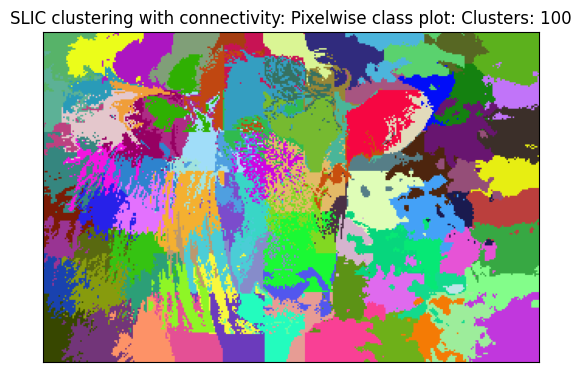

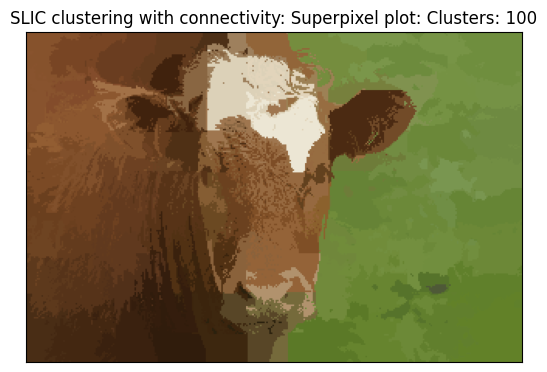

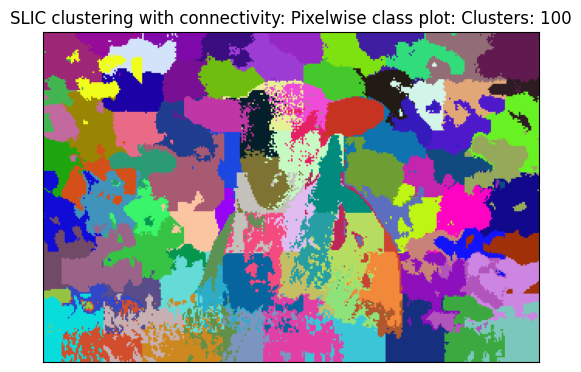

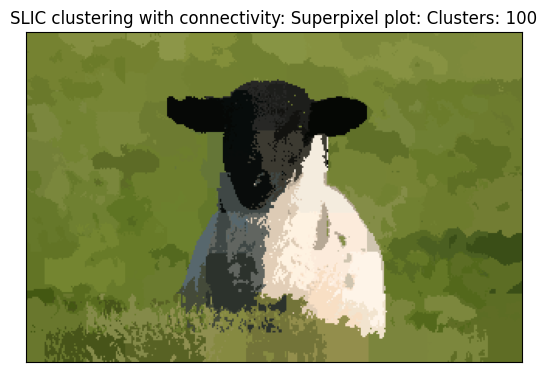

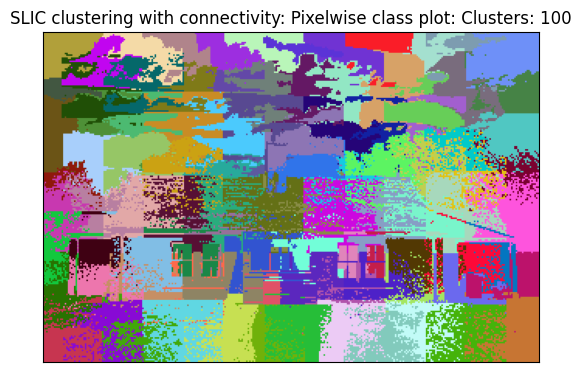

...

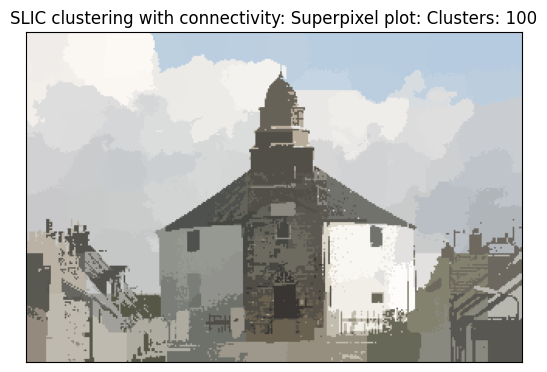

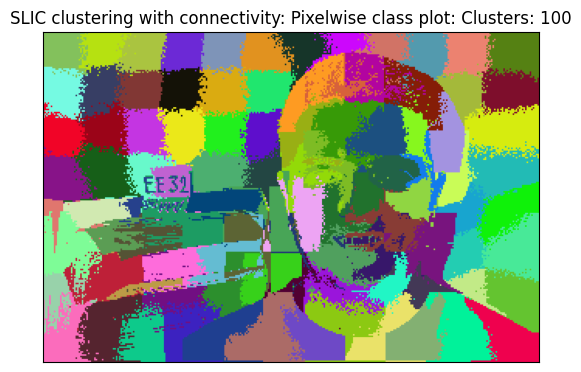

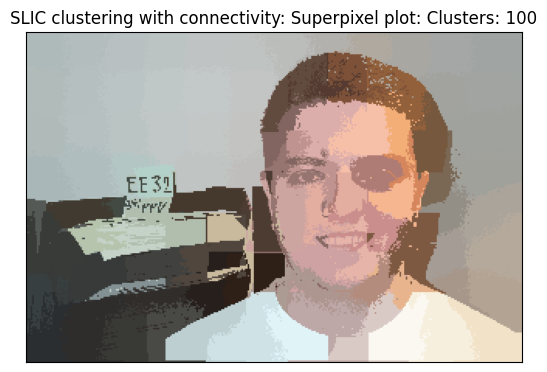

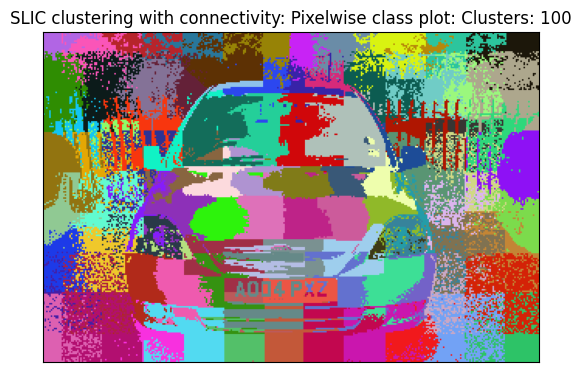

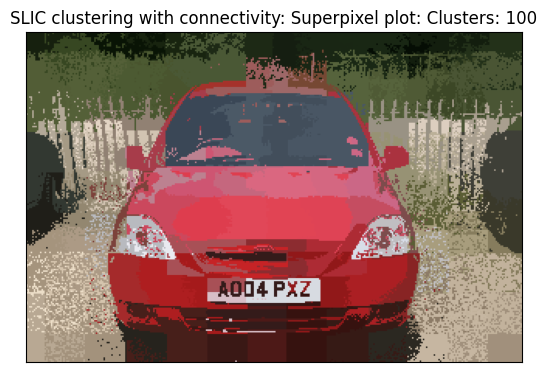

In [ ]:
k=100
for i, im_name in enumerate(im_list):
  im = cv2.imread(im_name)
  print('generating clusters for image', i+1)
  clusters = SLIC_connectivity(im, k)
  _ = rgb_segment(clusters,n = k, title =  "SLIC clustering with connectivity: Pixelwise class plot: Clusters: " + str(k), legend = False)
  superpixel_plot(im,clusters,title =  "SLIC clustering with connectivity: Superpixel plot: Clusters: "+ str(k))


## Part 2: Segmentation

For this part, you will use your best superpixels to build an image segmentation system. Alternatively, you can use SLIC from some library, as we demonstrate in the Data section that follows.

### Data

This is mostly the same as the last part, except now we also need to consider the annotated ground truth segmentation maps.

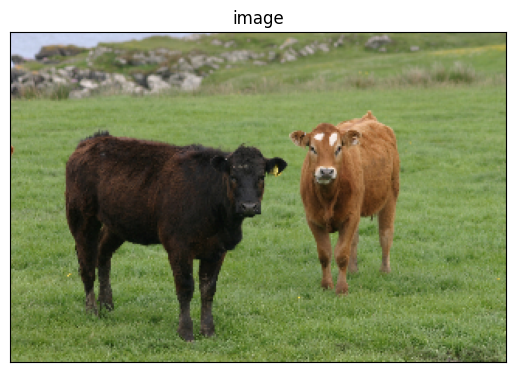

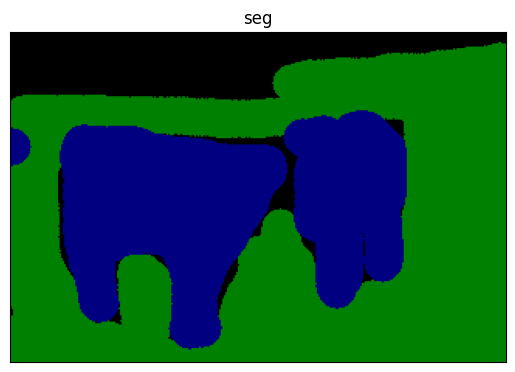

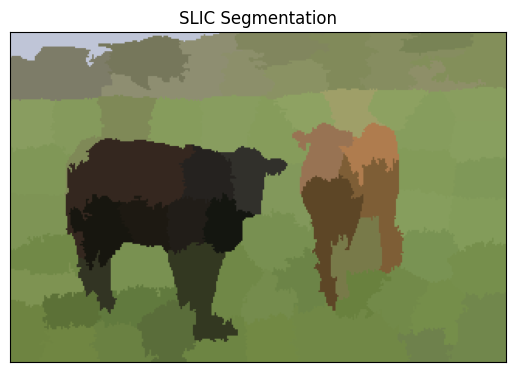

In [ ]:
#  plot a sample image and its ground truth segments
image_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s.bmp')
seg_sample = cv2.imread('MSRC_ObjCategImageDatabase_v1/1_19_s_GT.bmp')
plot_image(image_sample, 'image')
plot_image(seg_sample, 'seg')

#  run SLIC on the sample image and plot the corresponding SLIC segments
from skimage.segmentation import slic

segments_sample = slic(image_sample, n_segments=100, compactness=10)
superpixel_plot(image_sample, segments_sample, title = "SLIC Segmentation")

In [ ]:
from IPython import embed
import os
import cv2
import pandas as pd
from skimage.segmentation import slic

current_directory = os.getcwd()
msrc_directory = current_directory + '/MSRC_ObjCategImageDatabase_v1'

#Superpixel dataset preparation

# from Dataset_v1
SEG_LABELS_LIST_v1 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 5,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 6, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 7, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 8, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 9, "name": "horse",       "rgb_values": [128,   0,    128]},
    {"id": 10, "name": "water",       "rgb_values": [64,   128,    0]},
    {"id": 11, "name": "mountain",       "rgb_values": [64,   0,    0]},
    {"id": 12, "name": "sheep",       "rgb_values": [0,   128,    128]}]

# from Dataset_v2
SEG_LABELS_LIST_v2 = [
    {"id": -1, "name": "void",       "rgb_values": [0,   0,    0]},
    {"id": 0,  "name": "building",   "rgb_values": [128, 0,    0]},
    {"id": 1,  "name": "grass",      "rgb_values": [0,   128,  0]},
    {"id": 2,  "name": "tree",       "rgb_values": [128, 128,  0]},
    {"id": 3,  "name": "cow",        "rgb_values": [0,   0,    128]},
    {"id": 4,  "name": "horse",      "rgb_values": [128, 0,    128]},
    {"id": 5,  "name": "sheep",      "rgb_values": [0,   128,  128]},
    {"id": 6,  "name": "sky",        "rgb_values": [128, 128,  128]},
    {"id": 7,  "name": "mountain",   "rgb_values": [64,  0,    0]},
    {"id": 8,  "name": "airplane",   "rgb_values": [192, 0,    0]},
    {"id": 9,  "name": "water",      "rgb_values": [64,  128,  0]},
    {"id": 10, "name": "face",       "rgb_values": [192, 128,  0]},
    {"id": 11, "name": "car",        "rgb_values": [64,  0,    128]},
    {"id": 12, "name": "bicycle",    "rgb_values": [192, 0,    128]},
    {"id": 13, "name": "flower",     "rgb_values": [64,  128,  128]},
    {"id": 14, "name": "sign",       "rgb_values": [192, 128,  128]},
    {"id": 15, "name": "bird",       "rgb_values": [0,   64,   0]},
    {"id": 16, "name": "book",       "rgb_values": [128, 64,   0]},
    {"id": 17, "name": "chair",      "rgb_values": [0,   192,  0]},
    {"id": 18, "name": "road",       "rgb_values": [128, 64,   128]},
    {"id": 19, "name": "cat",        "rgb_values": [0,   192,  128]},
    {"id": 20, "name": "dog",        "rgb_values": [128, 192,  128]},
    {"id": 21, "name": "body",       "rgb_values": [64,  64,   0]},
    {"id": 22, "name": "boat",       "rgb_values": [192, 64,   0]}]

# create a map rgb_2_label, where mapping the ground truth 3-d array segmentation into a single ID label.
rgb_2_label = {}

for i in SEG_LABELS_LIST_v1:
    rgb_2_label[tuple(i['rgb_values'])] = i['id']

### Question 5: Superpixel Dataset (30 points)

First, we dilate each superpixel and save the output superpixel patch from SLIC into 224X224 size image (after rescaling), alongwith the ground truth segments label.

For the purpose of consistency, we adopt the existing SLIC implementation from the scikit-learn machine learning package.

Suggested algorithm: Save the superpixels along with their segmentation class. You could implement this as follows:

For each image
1. Get superpixels sp_i for image x. We adopt 100 segments in this assignment, 'segments = slic(image, n_segments=100, compactness=10)'.
2. For every superpixel sp_i in the image, \\
    2.1. find the smallest rectangle which can enclose sp_i <br>
    2.2. Dilate the rectangle by 3 pixels.<br>
    2.3. Get the same region from the segmentation image (from the file with similar name with *_GT). The class for this sp_i is mode of segmentation classes in that same region. Save the dilated region as npy (jpg is lossy for such small patches).<br>


Alternatively, you could create a single csv with columns segment patch location, class label for each sp_i of each image.<br>italicized text

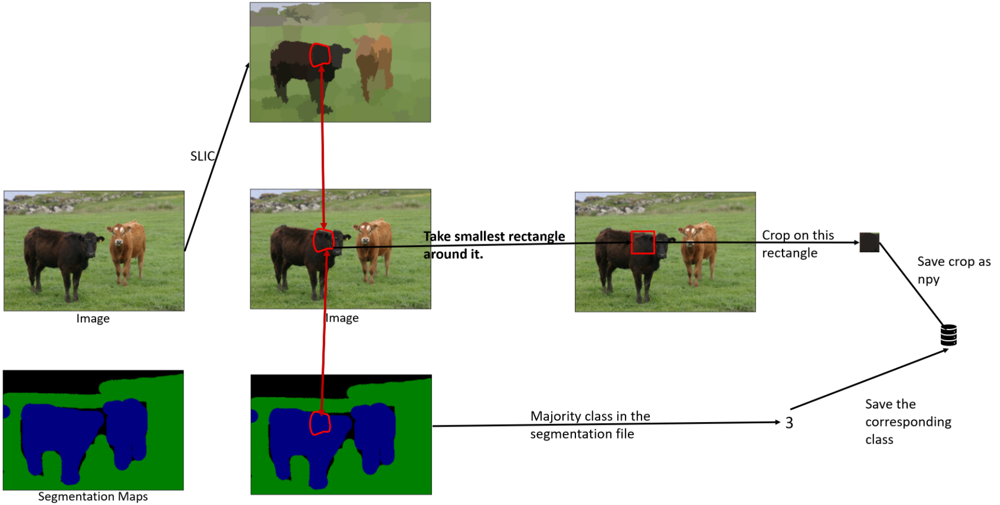


In addition to your code, **the primary graded deliverables** for this question are the 12 demo images we request after you have written code for the dataset.

In [ ]:
import os
import numpy as np
import torch
import torch.utils.data as data
from PIL import Image
from torchvision import transforms
import _pickle as pickle
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
import statistics as st
import time
from IPython.display import clear_output
import pandas as pd
from skimage.segmentation import slic

In [ ]:
def validate(x, y, width, height):
    if x == -1: x = 0
    if y == -1: y = 0
    if width == -1: width = 0
    if height == -1: height = 0
    return x, y, width, height


In [ ]:
empty_seg_data = {'im': 'NaN', 'seg_id': 0, 'x': 0, 'y': 0, 'width': 0, 'height': 0, 'gt_label': 0}
empty_seg_data_df = pd.DataFrame(empty_seg_data, index = [0])

count = 1
for filename in os.listdir(msrc_directory):
    if filename.endswith('_s.bmp'):
      path = msrc_directory + '/' + filename[:-4]
      im = cv2.imread(msrc_directory +'/' + filename)
      gt = cv2.imread(path + '_GT.bmp')

      seg_map = slic(im, n_segments=100, compactness=10)

      seg_ids = np.unique(seg_map)

      for seg_id in seg_ids:
        mask = seg_map.copy()
        mask[mask != seg_id] = 0

        contours, _ = cv2.findContours(mask, cv2.CV_32SC1, cv2.CHAIN_APPROX_SIMPLE)
        x, y, width, height = cv2.boundingRect(contours[0])
        x, y, width, height = validate(x, y, width, height)

        im_cropped = im[y : y + height, x : x + width]
        gt_cropped = gt[y : y + height, x : x + width]

        gt_mask = np.zeros((gt_cropped.shape[0], gt_cropped.shape[1]))

        for i in range(gt_cropped.shape[0]):
          for j in range(gt_cropped.shape[1]):
            color_vals = gt_cropped[i][j]
            try:
              gt_mask[i][j] = rgb_2_label[tuple(color_vals)]
            except:
              gt_mask[i][j] = -1

        gt_cropped = np.array(gt_cropped)
        gt_label = st.mode(gt_mask.flatten())

        seg_data = {'im': filename, 'seg_id': seg_id, 'x': x, 'y': y, 'width': width, 'height': height, 'gt_label': gt_label}

        df = pd.DataFrame(seg_data, index = [count])

        if(count==1):
          new_df = pd.concat([empty_seg_data_df, df])
        else:
          new_df = pd.concat([new_df, df])
        count+=1

new_df.drop(index = new_df.index[0], axis=0, inplace=True)
new_df.to_csv('train.csv')

In [ ]:
class SegmentationData(data.Dataset):
    def __init__(self, file_name, directory_name, transform = None):
        self.data = pd.read_csv(file_name)
        self.folder = directory_name
        self.transform = transform

    def __len__(self):
        return len(set(self.data['im']))

    def __getitem__(self, index):
        index_ = index
        images = self.data['im'].unique()
        self.name = os.path.join(self.folder, images[index_])
        self.image = cv2.imread(self.name)
        im_data = self.data[self.data['im']==images[index_]]

        item = {}

        for i in range(len(im_data)):
            ind_superpixel_data = im_data.iloc[i]
            x, y, width, height = int(ind_superpixel_data['x']), int(ind_superpixel_data['y']), int(ind_superpixel_data['width']), int(ind_superpixel_data['height'])
            new_img = np.array(self.image[y:y+height, x:x+width])
            new_img = cv2.resize(new_img, (224,224), interpolation=cv2.INTER_LINEAR)
            output = {'image': new_img, 'label': ind_superpixel_data['gt_label']}
            item.update({i: output})
        return item


Show some outputs! Choose 1 image. For that image, plot the image, along with the superpixel map for the image, as you did for Assignment 1. Then, show the first 10 superpixel patches for the image, retrieved from your dataset.

The output for this portion will be 12 images, displayed below your code below.

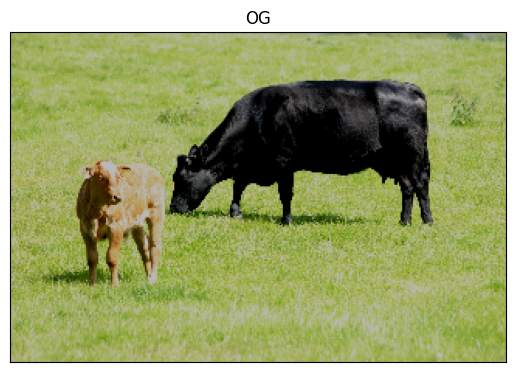

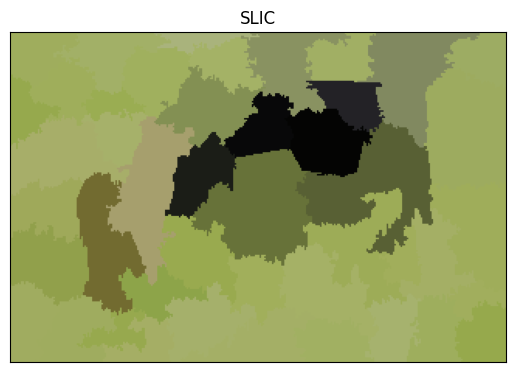

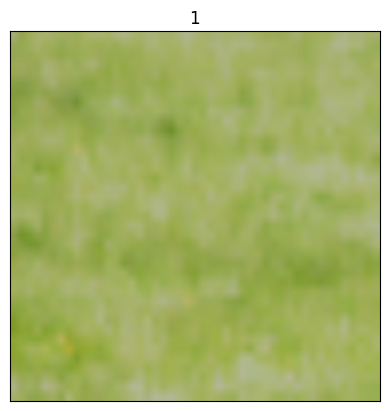

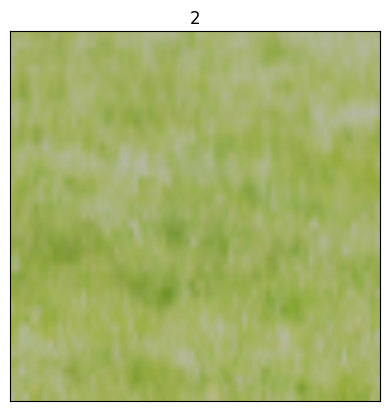

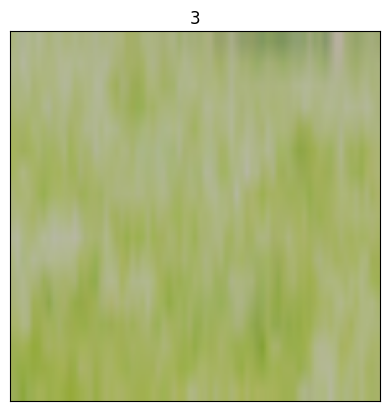

...

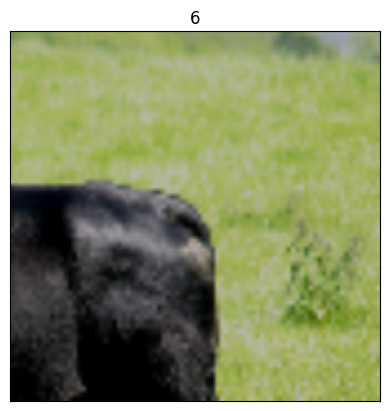

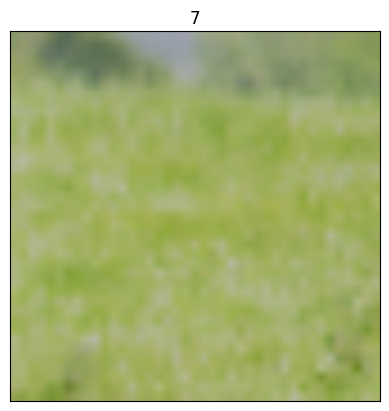

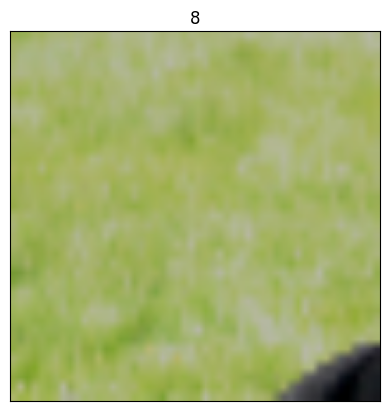

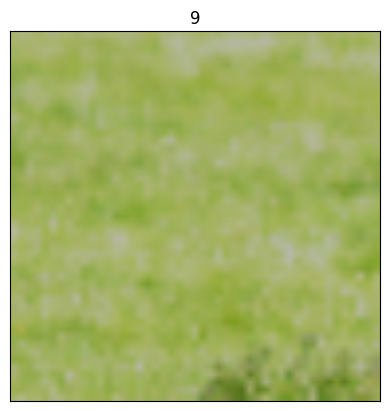

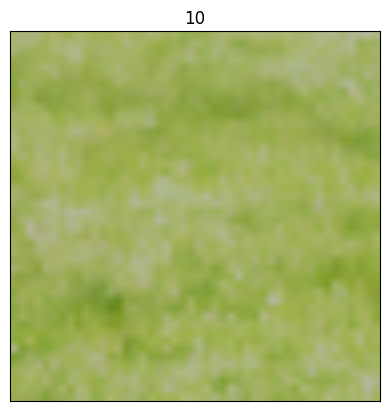

In [ ]:
dataset = SegmentationData('train.csv', msrc_directory, transform=None)

img = dataset.__getitem__(10) #choose a random image from the dataset

im = dataset.image
plot_image(im, "OG")

seg_map = slic(im, n_segments=100, compactness=10)
superpixel_plot(im, seg_map, title = "SLIC")

for i in range(10):
    ind_superpixel_data = img[i]['image']
    plot_image(ind_superpixel_data, "%s"%(i+1))

### Question 6: Deep Network (10 points)

You could use a pre-trained network (like VGG) and replace the last few layers with a fully connected layer.

In [ ]:
import tensorflow as tf
from keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

In [ ]:
# Model definition
class SegmentationNN(nn.Module):
    def __init__(self):
        self.model = VGG19(input_shape = [224,224,3], weights='imagenet', include_top=False)

        for layers in self.model.layers:
          layers.trainable=False
        x = Flatten()(self.model.output)
        prediction = Dense(14, activation='softmax')(x)
        self.model = Model(inputs=self.model.input, outputs=prediction)
        self.model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy']) #loss and optimizer

    def forward(self, x_train, y_train):
        history = self.model.fit(x_train, y_train, epochs=20, batch_size = 38)
        return history

    def predict(self, x_test):
        return(self.model.predict(x_test))


### Question 7: Optimizer (10 points)

Finally, we define the classification loss and optimizer such that we can learn a superpixel classifier from the backproporgation algorithm.

In [ ]:
# Optimizer
class Solver(object):
    def __init__(self):
        # Your code
        pass

    def train(self):
        # Your code
        pass

### Question 8: Putting it together (50 points)

Train your network and observe the loss in time.
During the inference stage, combine the SLIC Superpixels' predicted labels to form the whole input image's superpixel segmentation results.
The following 4 items are the primary graded components:

1. You must randomly split the whole dataset into train and test subset (80:20 split is fine).
2. You must show the training loss of the classifier after every epoch
3. You must show the training accuracy and test accuracy of the classifier after training.
4. You must plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.

In [ ]:
dataset = SegmentationData('train.csv', msrc_directory, transform=None)

# load the data
x_train = []
y_train = []
n_im = dataset.__len__()

for i in range(n_im):
    clusters = dataset.__getitem__(i)
    for cluster in range(len(clusters)):
        im = clusters[cluster]['image']
        label = clusters[cluster]['label']
        x_train.append(np.array(im))
        y_train.append(label)

x_train = np.array(x_train)
y_train = np.array(y_train)

unique_values = np.unique(np.arange(-1, 13))

encoding = {}

for index, value in enumerate(unique_values):
    vector = np.zeros(len(unique_values), dtype=int)
    vector[index] = 1
    encoding[value] = vector

y_train = np.array([encoding[value] for value in y_train])

x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=0.2, shuffle=True)

80134624/80134624 [==============================] - 2s 0us/step
Epoch 1/20
309/309 [==============================] - 76s 199ms/step - loss: 4.2862 - accuracy: 0.7937
Epoch 2/20
309/309 [==============================] - 59s 192ms/step - loss: 1.4160 - accuracy: 0.9109
Epoch 3/20
309/309 [==============================] - 61s 196ms/step - loss: 0.7335 - accuracy: 0.9426
Epoch 4/20
309/309 [==============================] - 62s 199ms/step - loss: 0.6009 - accuracy: 0.9547
Epoch 5/20
309/309 [==============================] - 62s 202ms/step - loss: 0.5164 - accuracy: 0.9602
Epoch 6/20
309/309 [==============================] - 62s 202ms/step - loss: 0.4162 - accuracy: 0.9668
Epoch 7/20
309/309 [==============================] - 63s 203ms/step - loss: 0.2627 - accuracy: 0.9742
Epoch 8/20
309/309 [==============================] - 63s 203ms/step - loss: 0.2973 - accuracy: 0.9746
Epoch 9/20
309/309 [==============================] - 63s 203ms/step - loss: 0.3034 - accuracy: 0.9764
Epoch 10

Text(0.5, 1.0, 'Loss')

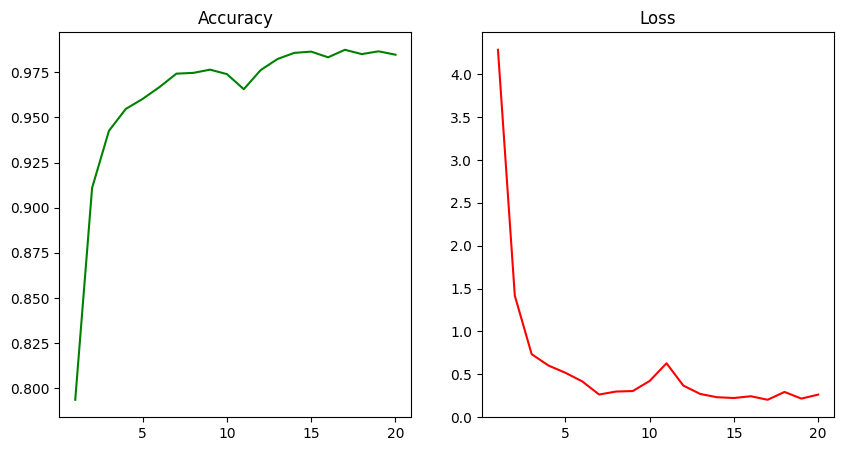

In [ ]:
# model
model = SegmentationNN()

# train the model
history = model.forward(x_train, y_train)

#plot training loss and training accuracy
acc = history.history["accuracy"]
loss = history.history["loss"]

x = range(1, len(acc) + 1)

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.plot(x, acc, "g", label="train_acc")
plt.title("Accuracy")

plt.subplot(1, 2, 2)
plt.plot(x, loss, "r", label="train_loss")
plt.title("Loss")

In [ ]:
#print test accuracy
pred = model.predict(x_test)

# reversing one hot encoding
for i, prediction in enumerate(pred):
    pred[i] = [1 if x==max(prediction) else 0 for x in prediction]

print("Testing accuracy: ", accuracy_score(y_test, pred))

92/92 [==============================] - 21s 171ms/step
Testing accuracy:  0.8571915473755964


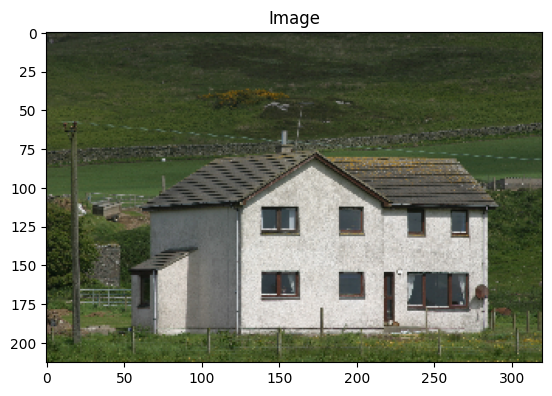

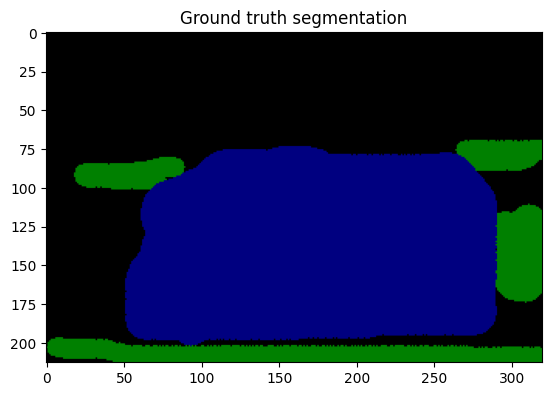

3/3 [==============================] - 0s 179ms/step


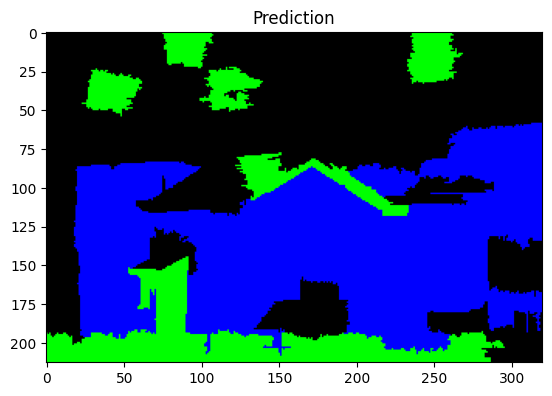

In [ ]:
# plot as least one visualization showing the test segmentation map vs. ground truth segmentation map.
seg = dataset.__getitem__(69)
test = cv2.imread(dataset.name)
test = cv2.cvtColor(test, cv2.COLOR_BGR2RGB)
plt.imshow(test)
plt.title("Image")
plt.show()

gt = cv2.imread(dataset.name[:-4] + '_GT.bmp')
plt.imshow(gt)
plt.title('Ground truth segmentation')
plt.show()

x_test = []
y_test = []

label_2_rgb = {}
for label_info in SEG_LABELS_LIST_v1:
    label_id = label_info['id']
    rgb_values = tuple(label_info['rgb_values'])
    label_2_rgb[label_id] = rgb_values

for segment in seg:
    im = seg[segment]['image']
    label = seg[segment]['label']
    x_test.append(np.array(im))
    y_test.append(label)

x_test = np.array(x_test)
predictions = model.predict(x_test)
labels = [0] * len(predictions)

for i, prediction in enumerate(predictions):
    predictions[i] = [1 if x==max(prediction) else 0 for x in prediction]
    labels[i] = np.where(predictions[i] == 1)[0][0] - 1

seg_map = slic(test, n_segments=100, compactness=10)
seg_map = np.array(seg_map)

empty_img = np.zeros(test.shape)

unique_value = np.unique(seg_map)

for i in unique_value:
  mask = (seg_map==i)
  empty_img[:, :, 0][mask] = label_2_rgb[labels[i-1]][0]
  empty_img[:, :, 1][mask] = label_2_rgb[labels[i-1]][1]
  empty_img[:, :, 2][mask] = label_2_rgb[labels[i-1]][2]

plt.imshow(empty_img)
plt.title('Prediction')
plt.show()

### Question 9: Bonus Question (20 points, OPTIONAL):

IMPORTANT: No matter which option you choose, you can earn a maximum of 20 points for this section.

We always want to increase the classifier accuracy and achieve a better performance by building a complicated deep learning model. There are a lot of tricks which are very popular and work in practice. Try to implement either of following two,

1. Could you effictively fuse different deep features from multiple layers in your network? You are welcome to use the pretrained network. Does your network achieve a better accuracy? There are a lot of exploration in the literature, including ION (Inside-Outside Net) [1], Hypercolumns [2], and PixelNet [3]. The following figure illustrates ION architecture combining features from different layers. Can you do similar thing for our Superpixel classifier?

2. Could you build a Multi-resolution network to explore the effectiveness of the multi-scale on the task of Superpixels segmentation? By multi-scale, we mean multiple resolutions of superpixels. See [4] for an example.

[1] Inside-Outside Net: Detecting Objects in Context with Skip Pooling and Recurrent Neural Networks

[2] Hypercolumns for Object Segmentation and Fine-grained Localization

[3] PixelNet: Representationofthe pixels, by the pixels, and for the pixels

[4] Feedforward semantic segmentation with zoom-out features

In [ ]:
# Bonus
